<a href="https://colab.research.google.com/github/AIID-Trend-Analysis-Project/AIID-Trend-Analysis/blob/main/Code/AIID%20Trend%20Analysis%20v1.1%20.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [ ]:
# Import standard Python libraries for operating system interaction, regular expressions, and abstract syntax trees
import os
import re
import ast

# External packages installation
!pip install umap-learn hdbscan textblob nltk

# Import data manipulation and analysis libraries
import pandas as pd
import numpy as np

# Import NLTK for natural language processing tasks
import nltk
from nltk.corpus import stopwords, wordnet
from nltk.tokenize import word_tokenize
from nltk.stem import WordNetLemmatizer
from nltk import pos_tag
nltk.download('averaged_perceptron_tagger')  # Download POS tagger data
nltk.download('wordnet')                    # Download WordNet data
nltk.download('stopwords')                  # Download stopwords data
nltk.download('omw-1.4')                    # Download Open Multilingual WordNet data
nltk.download('punkt')                      # Download Punkt tokenizer models
from nltk.sentiment import SentimentIntensityAnalyzer
nltk.download('vader_lexicon')              # Download VADER lexicon for sentiment analysis

# Import Gensim for topic modeling and natural language processing
from gensim import corpora, models
from gensim.models import LdaMulticore, CoherenceModel
from gensim.parsing.preprocessing import STOPWORDS

# Import TextBlob for easy text processing and sentiment analysis
from textblob import TextBlob

# Import visualization libraries
import matplotlib.pyplot as plt
import seaborn as sns
import plotly.express as px

# Import machine learning libraries for dimensionality reduction and clustering
import umap
import hdbscan

# Import PyTorch and Hugging Face's Transformers for state-of-the-art natural language processing
import torch
from transformers import AutoModel, AutoTokenizer

# Import logging for debugging and recording runtime events
import logging

[nltk_data] Downloading package averaged_perceptron_tagger to
[nltk_data]     /root/nltk_data...
[nltk_data]   Package averaged_perceptron_tagger is already up-to-
[nltk_data]       date!
[nltk_data] Downloading package wordnet to /root/nltk_data...
[nltk_data]   Package wordnet is already up-to-date!
[nltk_data] Downloading package stopwords to /root/nltk_data...
[nltk_data]   Package stopwords is already up-to-date!
[nltk_data] Downloading package omw-1.4 to /root/nltk_data...
[nltk_data]   Package omw-1.4 is already up-to-date!
[nltk_data] Downloading package punkt to /root/nltk_data...
[nltk_data]   Package punkt is already up-to-date!
[nltk_data] Downloading package vader_lexicon to /root/nltk_data...
[nltk_data]   Package vader_lexicon is already up-to-date!


In [ ]:
# Define the base directory
base_dir = '/content/drive/My Drive/'

# Define the directory for the project
project_dir = os.path.join(base_dir, 'AIID Trend Analysis')

# Check if the project directory exists, if not, create it
if not os.path.exists(project_dir):
    os.makedirs(project_dir)

# Change directory to the project directory
os.chdir(project_dir)

# Clone the GitHub repository if it doesn't exist
repo_dir = "AIID-Trend-Analysis"  # Name of the repository directory
repo_url = "https://github.com/AIID-Trend-Analysis-Project/AIID-Trend-Analysis.git"

if not os.path.exists(repo_dir):
    # Clone the repository if it doesn't exist
    !git clone $repo_url $repo_dir

# Change directory to the repository directory
os.chdir(repo_dir)

# Pull the latest changes from GitHub
!git pull origin main

# Set Git user name and email
!git config --global user.email "stevenshen2000@gmail.com"
!git config --global user.name "stevenshen2000"


Cloning into 'AIID-Trend-Analysis'...
remote: Enumerating objects: 74, done.
remote: Counting objects: 100% (74/74), done.
remote: Compressing objects: 100% (68/68), done.
remote: Total 74 (delta 33), reused 21 (delta 3), pack-reused 0
Receiving objects: 100% (74/74), 18.97 MiB | 16.19 MiB/s, done.
Resolving deltas: 100% (33/33), done.
From https://github.com/AIID-Trend-Analysis-Project/AIID-Trend-Analysis
 * branch            main       -> FETCH_HEAD
Already up to date.


In [ ]:
# Access the file
Incidents = '/content/drive/My Drive/AIID Trend Analysis/AIID-Trend-Analysis/Data/040820204/incidents.csv'
Reports = '/content/drive/My Drive/AIID Trend Analysis/AIID-Trend-Analysis/Data/040820204/reports.csv'

# Read CSV files into DataFrames
Incidents = pd.read_csv(Incidents)
Reports = pd.read_csv(Reports)

# Convert string representations of lists in 'reports' to actual lists
Incidents['reports'] = Incidents['reports'].apply(ast.literal_eval)

# Explode the 'reports' column to separate each report ID
Incidents_exploded = Incidents.explode('reports')

# Convert the 'reports' column to integer type
Incidents_exploded['reports'] = Incidents_exploded['reports'].astype(int)
Reports['report_number'] = Reports['report_number'].astype(int)

# Merge on 'reports' from Incidents_exploded and 'report_number' from Reports
Combined = pd.merge(Incidents_exploded, Reports, left_on='reports', right_on='report_number', how='left')

# Filter rows where language is 'en'
Combined_filtered = Combined.query("language == 'en'")

# Drop specified columns
Combined_filtered = Combined_filtered.drop(columns=[
    'reports', 'ref_number', 'tags', '_id_x', '_id_y', 'epoch_date_downloaded',
    'epoch_date_modified', 'epoch_date_published', 'epoch_date_submitted',
    'date_downloaded', 'image_url'
])

# Rename specified columns
Cleantext = Combined_filtered.rename(columns={
    'incident_id_x': 'Incident_id',
    'date': 'Incident_Date',
    'description_x': 'Incident_Desc',
    'title_x': 'Incident_Title',
    'title_y': 'Report_Title',
    'description_y': 'Report_Desc'
}, inplace=False)

# Display the head of the Combined dataframe to verify the merge
Cleantext.head()

,Incident_id,Incident_Date,Alleged deployer of AI system,Alleged developer of AI system,Alleged harmed or nearly harmed parties,Incident_Desc,Incident_Title,incident_id_y,authors,date_modified,date_published,date_submitted,Report_Desc,language,report_number,source_domain,submitters,text,Report_Title,url
0,1,2015-05-19,"[""youtube""]","[""youtube""]","[""children""]",YouTube’s content filtering and recommendation...,Google’s YouTube Kids App Presents Inappropria...,NaN,"[""Alistair Barr""]",2020-06-14T00:00:00.000Z,2015-05-19T00:00:00.000Z,2019-06-01T00:00:00.000Z,Child and consumer advocacy groups complained ...,en,1,blogs.wsj.com,"[""Roman Yampolskiy""]",Child and consumer advocacy groups complained ...,Google’s YouTube Kids App Criticized for ‘Inap...,https://blogs.wsj.com/digits/2015/05/19/google...
1,1,2015-05-19,"[""youtube""]","[""youtube""]","[""children""]",YouTube’s content filtering and recommendation...,Google’s YouTube Kids App Presents Inappropria...,NaN,"[""Phoebe Weston""]",2020-06-14T00:00:00.000Z,2018-02-07T00:00:00.000Z,2019-06-01T00:00:00.000Z,Investigators found several unsuitable videos ...,en,2,dailymail.co.uk,"[""Roman Yampolskiy""]",Google-owned YouTube has apologised again afte...,YouTube Kids app is STILL showing disturbing v...,https://www.dailymail.co.uk/sciencetech/articl...
2,1,2015-05-19,"[""youtube""]","[""youtube""]","[""children""]",YouTube’s content filtering and recommendation...,Google’s YouTube Kids App Presents Inappropria...,NaN,"[""Terri Peters""]",2020-06-14T00:00:00.000Z,2016-08-06T00:00:00.000Z,2019-06-01T00:00:00.000Z,"Once again, parents have discovered shocking v...",en,3,today.com,"[""Roman Yampolskiy""]","Update, Nov. 7, 2017: TODAY Parents is reshari...",Disturbing YouTube Kids video shows Mickey Mou...,https://www.today.com/parents/moms-warn-distur...
3,1,2015-05-19,"[""youtube""]","[""youtube""]","[""children""]",YouTube’s content filtering and recommendation...,Google’s YouTube Kids App Presents Inappropria...,NaN,"[""Zoë Bernard""]",2020-06-14T00:00:00.000Z,2017-11-08T00:00:00.000Z,2019-06-01T00:00:00.000Z,The New York Times and writer James Bridle hav...,en,4,businessinsider.com,"[""Roman Yampolskiy""]","An off-brand Paw Patrol video called ""Babies P...",YouTube has thousands of disturbing videos tar...,https://www.businessinsider.com/youtube-has-th...
4,1,2015-05-19,"[""youtube""]","[""youtube""]","[""children""]",YouTube’s content filtering and recommendation...,Google’s YouTube Kids App Presents Inappropria...,NaN,"[""Julia Alexander""]",2020-06-14T00:00:00.000Z,2017-12-08T00:00:00.000Z,2019-06-01T00:00:00.000Z,‘It’s not a safe place for children to explore’,en,5,polygon.com,"[""Roman Yampolskiy""]","InIn the last few weeks, the world has learned...",YouTube Kids has been a problem since 2015 - w...,https://www.polygon.com/2017/12/8/16737556/you...


[nltk_data] Downloading package averaged_perceptron_tagger to
[nltk_data]     /root/nltk_data...
[nltk_data]   Package averaged_perceptron_tagger is already up-to-
[nltk_data]       date!
[nltk_data] Downloading package wordnet to /root/nltk_data...
[nltk_data]   Package wordnet is already up-to-date!
[nltk_data] Downloading package stopwords to /root/nltk_data...
[nltk_data]   Package stopwords is already up-to-date!
[nltk_data] Downloading package omw-1.4 to /root/nltk_data...
[nltk_data]   Package omw-1.4 is already up-to-date!
[nltk_data] Downloading package punkt to /root/nltk_data...
[nltk_data]   Package punkt is already up-to-date!


True

In [ ]:
# A helper function to map NLTK position tags
def get_wordnet_pos(treebank_tag):
    if treebank_tag.startswith('J'):
        return wordnet.ADJ
    elif treebank_tag.startswith('V'):
        return wordnet.VERB
    elif treebank_tag.startswith('N'):
        return wordnet.NOUN
    elif treebank_tag.startswith('R'):
        return wordnet.ADV
    else:
        return wordnet.NOUN  # By default, treat as noun

# Improved preprocessing function
def preprocess_and_lemmatize(text):
    # Lowercasing
    text = text.lower()
    # Removing URLs
    text = re.sub(r'http\S+', '', text)
    # Removing punctuation and special characters
    text = re.sub(r'\W', ' ', text)
    # Removing numbers
    text = re.sub(r'\d+', '', text)
    # Tokenization
    tokens = word_tokenize(text)
    # Removing stop words
    stop_words = set(stopwords.words('english')).union({'https', 'www', 'com'})  # Add more custom stop words as needed
    filtered_tokens = [word for word in tokens if word not in stop_words]  # Stop words are filtered out
    # Part-of-Speech Tagging
    tagged_tokens = pos_tag(filtered_tokens)
    # Lemmatization
    lemmatizer = WordNetLemmatizer()
    lemmatized_tokens = [lemmatizer.lemmatize(word, get_wordnet_pos(tag)) for word, tag in tagged_tokens]
    return ' '.join(lemmatized_tokens)  # Return processed text as a single string


# Apply preprocessing to the 'text' column
Cleantext['preprocessed_text'] = Cleantext['text'].apply(preprocess_and_lemmatize)

# Drop unnecessary columns and save the processed dataframe to a new CSV file
Cleantext = Cleantext.drop(columns=['text', 'language', 'date_modified'])


In [ ]:

def remove_say_advanced(text):
    # Using regular expression to find "say" and its variations more robustly
    # \b is a word boundary in regex, ensuring "say" is a distinct word
    # The pattern matches "say", "says", "saying"
    pattern = r'\bsay\b|\bsays\b|\bsaying\b'
    # Replace occurrences with an empty string
    return re.sub(pattern, '', text)

# Apply the enhanced function to remove "say" and its variations
Cleantext['preprocessed_text'] = Cleantext['preprocessed_text'].apply(remove_say_advanced)

Num Topics: 40, Coherence Score: 0.39394560219342073
Num Topics: 50, Coherence Score: 0.41712097274985205
Num Topics: 60, Coherence Score: 0.3815865288819847
Num Topics: 70, Coherence Score: 0.4305939498052527


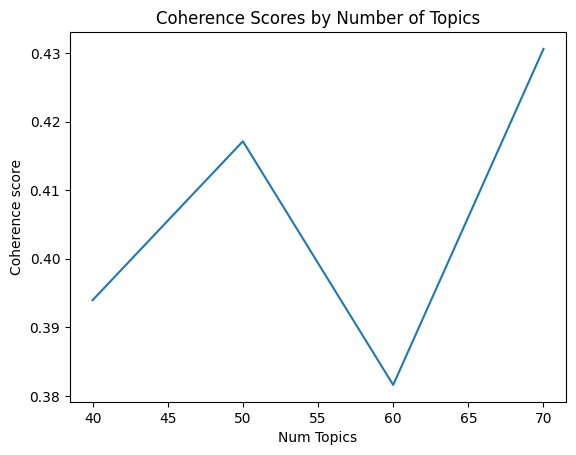

In [ ]:
def process_documents(df, text_column):
    """Tokenize, create dictionary and corpus from a dataframe text column."""
    documents = [text.split() for text in df[text_column].tolist()]
    dictionary = corpora.Dictionary(documents)
    corpus = [dictionary.doc2bow(doc) for doc in documents]
    return documents, dictionary, corpus

def find_optimal_topics(corpus, dictionary, texts, start, limit, step):
    """Test different numbers of topics and plot coherence scores to find the optimal number."""
    coherence_scores = []
    models = []
    for n_topics in range(start, limit, step):
        model = LdaMulticore(corpus, num_topics=n_topics, id2word=dictionary, passes=10, workers=2)
        models.append(model)
        coherencemodel = CoherenceModel(model=model, texts=texts, dictionary=dictionary, coherence='c_v')
        coherence_scores.append(coherencemodel.get_coherence())
        print(f"Num Topics: {n_topics}, Coherence Score: {coherencemodel.get_coherence()}")

    # Plot coherence scores
    plt.plot(range(start, limit, step), coherence_scores)
    plt.xlabel("Num Topics")
    plt.ylabel("Coherence score")
    plt.title("Coherence Scores by Number of Topics")
    plt.show()

    return models, coherence_scores

def add_dominant_topics_to_df(df, lda_model, corpus, num_words=3):
    """Add dominant topic number and keywords to the DataFrame."""
    dominant_topics = []
    for _, row_list in enumerate(lda_model[corpus]):
        row = sorted(row_list, key=lambda x: x[1], reverse=True)
        topic_num, prop_topic = row[0]
        wp = lda_model.show_topic(topic_num, topn=num_words)
        topic_keywords = ", ".join([word for word, prop in wp])
        dominant_topics.append((int(topic_num), round(prop_topic, 4), topic_keywords))

    df['Dominant_Topic'] = [item[0] for item in dominant_topics]
    df['Topic_Contribution'] = [item[1] for item in dominant_topics]
    df['Topic_Keywords'] = [item[2] for item in dominant_topics]
    return df

# Process the documents, create dictionary and corpus
documents, dictionary, corpus = process_documents(Cleantext, 'preprocessed_text')

# Find the optimal number of topics
models, coherence_scores = find_optimal_topics(corpus, dictionary, documents, 40, 71, 10) #starting number, ending number+1, incrementer

# Assuming the optimal model is the one with the highest coherence score
optimal_model_index = coherence_scores.index(max(coherence_scores))
optimal_lda_model = models[optimal_model_index]

# Add dominant topics to the DataFrame
Cleantext = add_dominant_topics_to_df(Cleantext, optimal_lda_model, corpus)

# Save the optimal model to disk
optimal_model_path = '/content/drive/MyDrive/AIID Trend Analysis/AIID-Trend-Analysis/Embeddings and Models/optimal_lda_model.lda'
optimal_lda_model.save(optimal_model_path)

In [ ]:
#Loading the distilled model and tokenizer
model_name = 'distilbert-base-uncased'
tokenizer = AutoTokenizer.from_pretrained(model_name)
model = AutoModel.from_pretrained(model_name)
texts = Cleantext['preprocessed_text'].tolist()

#Function to generate embeddings
def get_embeddings(texts):
     embeddings = []
     for text in texts:
         inputs = tokenizer(text, return_tensors="pt", padding=True, truncation=True, max_length=512)
         with torch.no_grad():  # Instructs torch to not keep track of gradients
             outputs = model(**inputs)
         # Use the mean of the last layer's embeddings as the text representation
         embeddings.append(outputs.last_hidden_state.mean(dim=1).detach().numpy())
     return np.array(embeddings)

# Get embeddings
embeddings = get_embeddings(texts)

np.save('text_embeddings.npy', embeddings)

KeyboardInterrupt: 

In [ ]:
import pandas as pd
import numpy as np
import umap
import hdbscan
import plotly.express as px

# Convert date_published to datetime objects, coercing any errors
Cleantext['date_published'] = pd.to_datetime(Cleantext['date_published'], errors='coerce')

# Drop rows with NaT values that resulted from coercion, if any exist
Cleantext.dropna(subset=['date_published'], inplace=True)

# Extract just the date parts, effectively dropping the time and timezone information
Cleantext['date_published'] = Cleantext['date_published'].dt.date

# Create the date_period column
Cleantext['date_period'] = Cleantext['date_published'].astype('datetime64[ns]').dt.to_period('M').dt.to_timestamp()

# Load the embeddings
embeddings = np.load('text_embeddings.npy')
embeddings = embeddings.squeeze()

# Apply UMAP
reducer = umap.UMAP(n_neighbors=15, min_dist=0.0, n_components=2, random_state=42)
umap_embeddings = reducer.fit_transform(embeddings)

# Apply HDBSCAN
clusterer = hdbscan.HDBSCAN(min_cluster_size=15, metric='euclidean')
cluster_labels = clusterer.fit_predict(umap_embeddings)

# Merge the clustering results with the main dataframe
Cleantext['umap_x'] = umap_embeddings[:, 0]
Cleantext['umap_y'] = umap_embeddings[:, 1]
Cleantext['cluster'] = cluster_labels


/usr/local/lib/python3.10/dist-packages/umap/umap_.py:1945: UserWarning: n_jobs value 1 overridden to 1 by setting random_state. Use no seed for parallelism.
  warn(f"n_jobs value {self.n_jobs} overridden to 1 by setting random_state. Use no seed for parallelism.")


In [ ]:
# Sentiment Analysis with TextBlob - polarity (Range from -1.0 to 1.0)
def get_textblob_sentiment_P(text):
    blobP = TextBlob(text)
    return blobP.sentiment.polarity

Cleantext['textblob_polarity'] = Cleantext['preprocessed_text'].apply(get_textblob_sentiment_P)

# Sentiment Analysis with TextBlob - subjectivity (Original Range from 0.0 to 1.0)
def get_textblob_sentiment_S(text):
    blobS = TextBlob(text)
    # Scale from 0.0-1.0 to -1.0-1.0
    return 2 * blobS.sentiment.subjectivity - 1

Cleantext['textblob_subjectivity'] = Cleantext['preprocessed_text'].apply(get_textblob_sentiment_S)

# Sentiment Analysis with VADER
sia = SentimentIntensityAnalyzer()

def get_vader_sentiment(text):
    score = sia.polarity_scores(text)
    return score['compound']

Cleantext['vader_sentiment'] = Cleantext['preprocessed_text'].apply(get_vader_sentiment)


# Save the results CSV
Cleantext.to_csv('Cleantext.csv', index=False)


In [ ]:
Cleantext = pd.read_csv('/content/drive/My Drive/AIID Trend Analysis/AIID-Trend-Analysis/Data/Generated model 04082024/Cleantext.csv')

In [ ]:
import pandas as pd
import plotly.express as px

# Convert 'date_period' to datetime if it's not already
if Cleantext['date_period'].dtype == 'object':
    Cleantext['date_period'] = pd.to_datetime(Cleantext['date_period'])

# Sort the DataFrame by date
Cleantext.sort_values(by='date_period', inplace=True)

# Preparing data frames for each animation frame
frames = []
unique_dates = Cleantext['date_period'].unique()
for date in unique_dates:
    # Filter data up to the current date
    frame_data = Cleantext[Cleantext['date_period'] <= date].copy()
    frame_data['date_period_str'] = date.strftime('%Y-%m-%d')  # Better readability in date format
    frames.append(frame_data)

# Concatenate all frames
all_frames = pd.concat(frames)

# Find global ranges for x and y to ensure consistent scaling
x_min = all_frames['umap_x'].min()
x_max = all_frames['umap_x'].max()
y_min = all_frames['umap_y'].min()
y_max = all_frames['umap_y'].max()

# Define a buffer percentage to avoid points being on the edge
buffer_percentage = 0.05
x_buffer = (x_max - x_min) * buffer_percentage
y_buffer = (y_max - y_min) * buffer_percentage

# Improved color palette with categorical colors
num_clusters = all_frames['cluster'].nunique()
color_palette = px.colors.qualitative.Dark24[:num_clusters]

# Define color map for cluster -1 and ensure all clusters have a color
color_discrete_map = {cluster: color for cluster, color in zip(all_frames['cluster'].unique(), color_palette)}

# Create the animation
fig = px.scatter(
    all_frames,
    x='umap_x',
    y='umap_y',
    animation_frame='date_period_str',
    color='cluster',
    hover_name='Topic_Keywords',
    hover_data=['Report_Title'],
    title='Interactive Cluster Visualization over Time',
    color_discrete_map=color_discrete_map,
    range_x=[x_min - x_buffer, x_max + x_buffer],  # Set x-axis range
    range_y=[y_min - y_buffer, y_max + y_buffer],  # Set y-axis range
)

# Improve point visibility
fig.update_traces(marker=dict(size=10, opacity=0.8))

# Improve layout
fig.update_layout(
    autosize=True,
    width=900,
    height=700,
    margin=dict(l=50, r=50, b=50, t=100),  # Adjust margins to fit the title and legend
    legend=dict(title='Clusters', x=1, y=0.5),  # Place legend outside
    xaxis_title="Geographical Failure ← → Technological Failure",
    yaxis_title="Digital Failure ← → Physical Failure"
)
# Configure animation and slider
frame_duration = 1000  # One second per frame for a smoother transition
for slider_step in fig['layout']['sliders'][0]['steps']:
    slider_step['args'][1]['frame']['duration'] = frame_duration

fig['layout']['updatemenus'][0]['buttons'][0]['args'][1]['frame']['duration'] = frame_duration
fig['layout']['updatemenus'][0]['buttons'][1]['args'][1]['frame']['duration'] = 0

# Show the visualization
fig.show()


In [ ]:
# Ensure date_published is a datetime object
Cleantext['date_published'] = pd.to_datetime(Cleantext['date_published'], errors='coerce')

# Drop rows with NaT values if any
Cleantext.dropna(subset=['date_published'], inplace=True)

def plot_data_before_year(df, year):
    # Filter the data for entries before the specified year
    data_before_year = df[df['date_published'].dt.year < year]

    # Improved color palette with categorical colors
    num_clusters = data_before_year['cluster'].nunique()
    color_palette = px.colors.qualitative.Set1[:num_clusters]

    fig = px.scatter(
        data_before_year,
        x='umap_x',
        y='umap_y',
        color='cluster',
        color_discrete_sequence=color_palette,  # Use the new color palette
        hover_name='Topic_Keywords',
        hover_data={'Report_Title': True, 'date_published': True, 'cluster': True},
        title=f'Topic Cluster Visualization of Published Reports Before {year}',
        labels={'umap_x': 'UMAP Component 1', 'umap_y': 'UMAP Component 2'},
    )

    # Adjust the layout to use the space more effectively
    fig.update_layout(
        autosize=True,
        width=800,
        height=600,
        xaxis_title="Geographical Failure ← → Technological Failure",
        yaxis_title="Digital Failure ← → Physical Failure"
    )

    # Improve point visibility
    fig.update_traces(marker=dict(size=7, opacity=0.7, line=dict(width=0.5, color='DarkSlateGrey')))

    # Display the figure
    fig.show()

# Call the function with the updated visualization
plot_data_before_year(Cleantext, 2015)

In [ ]:
# Ensure date_published is a datetime object
Cleantext['date_published'] = pd.to_datetime(Cleantext['date_published'], errors='coerce')

# Drop rows with NaT values if any
Cleantext.dropna(subset=['date_published'], inplace=True)

# Visualization function updated to match the style
def plot_yearly_data(df, year):
    yearly_data = df[df['date_published'].dt.year == year]

    # Apply the improved color palette with categorical colors
    num_clusters = yearly_data['cluster'].nunique()
    color_palette = px.colors.qualitative.Set1[:num_clusters]

    # Create the scatter plot
    fig = px.scatter(
        yearly_data,
        x='umap_x',
        y='umap_y',
        color='cluster',
        color_discrete_sequence=color_palette,  # Use the new color palette
        hover_name='Topic_Keywords',
        hover_data={'Report_Title': True, 'date_published': True, 'cluster': True},
        title=f'Topic Cluster Visualization for {year}',
        labels={'umap_x': 'UMAP Component 1', 'umap_y': 'UMAP Component 2'},
    )

    # Adjust the layout to use the space more effectively
    fig.update_layout(
        autosize=True,
        width=800,
        height=600,
        xaxis_title="Geographical Failure ← → Technological Failure",
        yaxis_title="Digital Failure ← → Physical Failure"
    )

    # Improve point visibility
    fig.update_traces(marker=dict(size=7, opacity=0.7, line=dict(width=0.5, color='DarkSlateGrey')))

    # Display the figure
    fig.show()

# Call the function for each year of interest
for year in range(2015, 2025):
    plot_yearly_data(Cleantext, year)


<ipython-input-95-4a9173660e24>:5: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



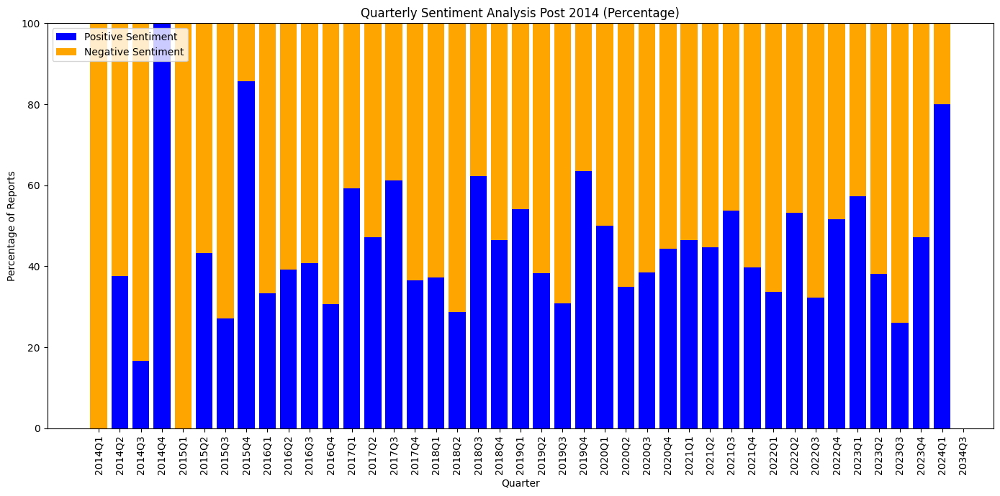

In [ ]:
# Convert date_period to datetime and filter the data for post 2014
cleantext_post_2014 = Cleantext[Cleantext['date_period'].dt.year >= 2014]

# Resample data to 3-month intervals and separate positive and negative sentiment values
cleantext_post_2014['Quarter'] = cleantext_post_2014['date_period'].dt.to_period('Q')

# Group by the new Quarter column and separate positive and negative sentiment
quarterly_sentiment = cleantext_post_2014.groupby('Quarter')['vader_sentiment'].apply(list).reset_index()
quarterly_sentiment['Positive'] = quarterly_sentiment['vader_sentiment'].apply(lambda x: sum([1 for i in x if i > 0]))
quarterly_sentiment['Negative'] = quarterly_sentiment['vader_sentiment'].apply(lambda x: sum([1 for i in x if i < 0]))
quarterly_sentiment['Total'] = quarterly_sentiment['Positive'] + quarterly_sentiment['Negative']
quarterly_sentiment['Positive_Percentage'] = (quarterly_sentiment['Positive'] / quarterly_sentiment['Total']) * 100
quarterly_sentiment['Negative_Percentage'] = (quarterly_sentiment['Negative'] / quarterly_sentiment['Total']) * 100

# Plotting the stacked bar chart with percentages for quarterly data
plt.figure(figsize=(14, 7))

# Positive sentiment bars
plt.bar(quarterly_sentiment['Quarter'].astype(str), quarterly_sentiment['Positive_Percentage'], color='blue', label='Positive Sentiment')

# Negative sentiment bars
plt.bar(quarterly_sentiment['Quarter'].astype(str), quarterly_sentiment['Negative_Percentage'], bottom=quarterly_sentiment['Positive_Percentage'], color='orange', label='Negative Sentiment')

# Set xticks to just the year and quarter
plt.xticks([str(x) for x in quarterly_sentiment['Quarter']], rotation=90)

plt.title('Quarterly Sentiment Analysis Post 2014 (Percentage)')
plt.xlabel('Quarter')
plt.ylabel('Percentage of Reports')
plt.legend()
plt.tight_layout()
plt.show()



<ipython-input-101-46cd24cefc9c>:6: FutureWarning:



Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.




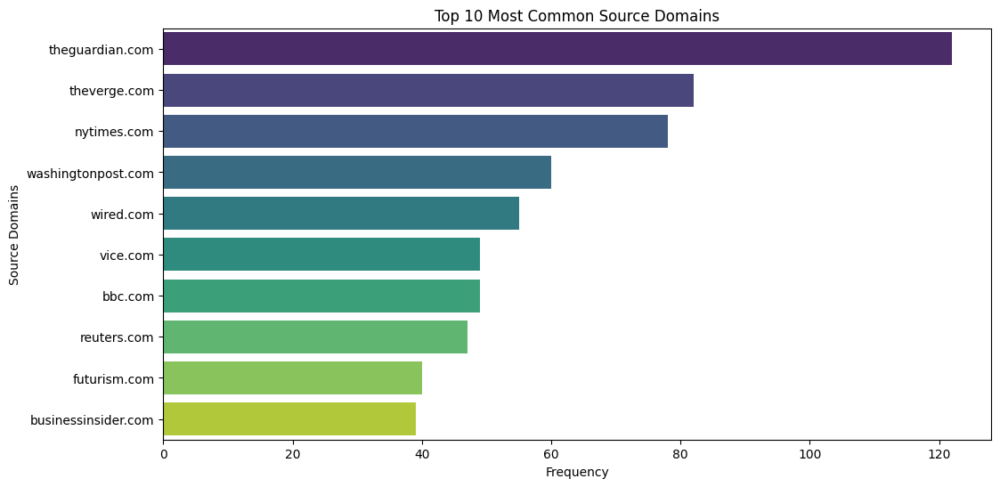

In [ ]:
# Calculate the frequency of each source domain
source_domains_counts = Cleantext['source_domain'].value_counts().head(10)

# Plotting the frequency count of the top 10 most common source domains
plt.figure(figsize=(12, 6))
sns.barplot(x=source_domains_counts.values, y=source_domains_counts.index, palette="viridis")
plt.title('Top 10 Most Common Source Domains')
plt.xlabel('Frequency')
plt.ylabel('Source Domains')
plt.show()


In [ ]:
Cleantext.head()

,Incident_id,Incident_Date,Alleged deployer of AI system,Alleged developer of AI system,Alleged harmed or nearly harmed parties,Incident_Desc,Incident_Title,incident_id_y,authors,date_published,...,Dominant_Topic,Topic_Contribution,Topic_Keywords,date_period,umap_x,umap_y,cluster,textblob_polarity,textblob_subjectivity,vader_sentiment
0,1,2015-05-19,"[""youtube""]","[""youtube""]","[""children""]",YouTube’s content filtering and recommendation...,Google’s YouTube Kids App Presents Inappropria...,NaN,"[""Alistair Barr""]",2015-05-19,...,47,0.4891,"school, image, child",2015-05-01,6.961864,1.848482,18,0.239394,-0.004040,-0.0772
1,1,2015-05-19,"[""youtube""]","[""youtube""]","[""children""]",YouTube’s content filtering and recommendation...,Google’s YouTube Kids App Presents Inappropria...,NaN,"[""Phoebe Weston""]",2018-02-07,...,26,0.5787,"video, youtube, election",2018-02-01,12.176998,-2.899422,-1,0.086139,0.031432,-0.9738
2,1,2015-05-19,"[""youtube""]","[""youtube""]","[""children""]",YouTube’s content filtering and recommendation...,Google’s YouTube Kids App Presents Inappropria...,NaN,"[""Terri Peters""]",2016-08-06,...,26,0.7789,"video, youtube, election",2016-08-01,12.182359,-2.914595,-1,0.017706,0.127175,0.9595
3,1,2015-05-19,"[""youtube""]","[""youtube""]","[""children""]",YouTube’s content filtering and recommendation...,Google’s YouTube Kids App Presents Inappropria...,NaN,"[""Zoë Bernard""]",2017-11-08,...,26,0.8340,"video, youtube, election",2017-11-01,12.180959,-2.901735,-1,0.112034,0.003730,-0.9382
4,1,2015-05-19,"[""youtube""]","[""youtube""]","[""children""]",YouTube’s content filtering and recommendation...,Google’s YouTube Kids App Presents Inappropria...,NaN,"[""Julia Alexander""]",2017-12-08,...,26,0.3733,"video, youtube, election",2017-12-01,12.182202,-2.893416,-1,0.052820,-0.096390,0.9589


Clusters and Their Frequencies for Keyword: facial
+---+---------+-----------+
|   | Cluster | Frequency |
+---+---------+-----------+
| 0 |   -1    |    56     |
| 1 |   50    |    29     |
| 2 |   51    |    29     |
| 3 |   49    |    24     |
| 4 |   19    |    19     |
+---+---------+-----------+

Authors and Their Frequencies for Keyword: facial
+---+------------------------------+-----------+
|   |           Authors            | Frequency |
+---+------------------------------+-----------+
| 0 |       ["Kashmir Hill"]       |     4     |
| 1 |      ["Johana Bhuiyan"]      |     3     |
| 2 |      ["Khari Johnson"]       |     3     |
| 3 | ["Federal Trade Commission"] |     3     |
| 4 |         ["BBC News"]         |     2     |
+---+------------------------------+-----------+

Top 12 Keywords in Top 5 Clusters:
+----+-----------------------------+-----------+
|    |           Keyword           | Frequency |
+----+-----------------------------+-----------+
| 0  |  use, recogniti

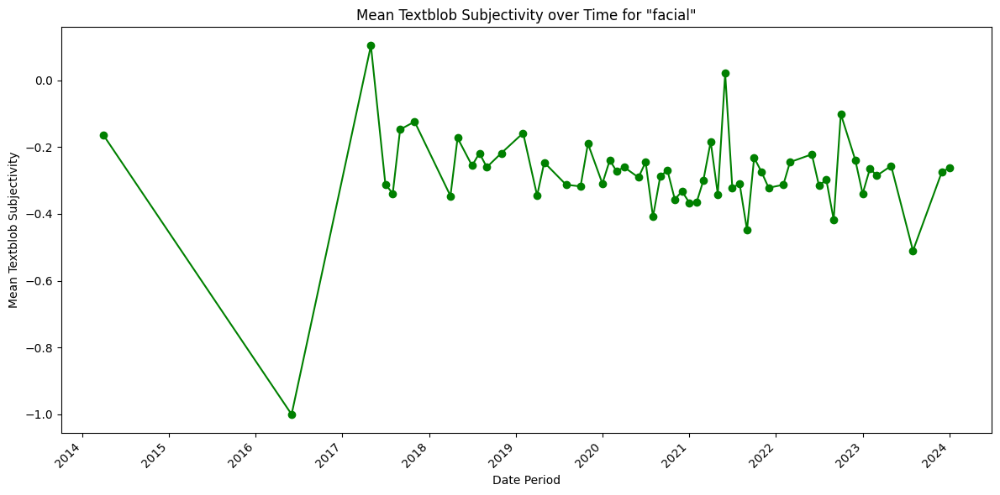

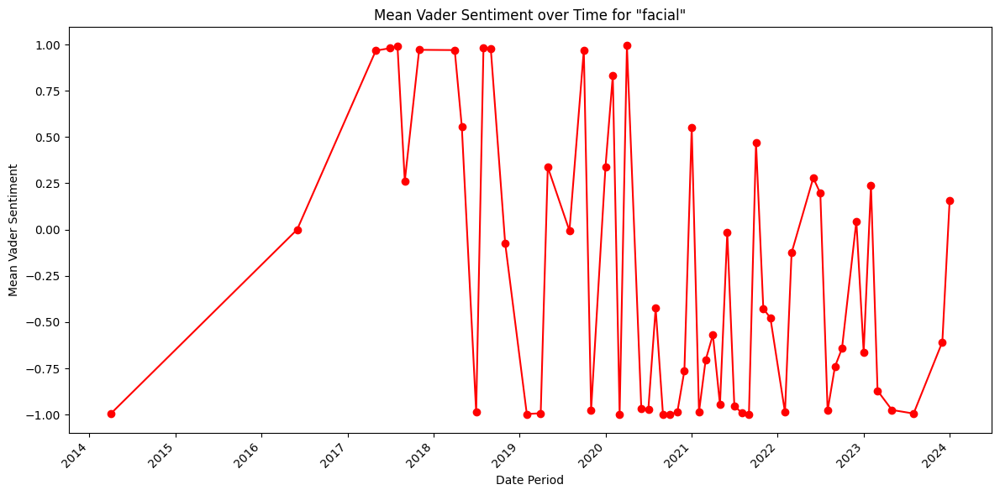

In [ ]:
from tabulate import tabulate


def analyze_keyword_data_combined(keyword):
    # Filter rows where 'Topic_Keywords' contains the specified keyword
    filtered_rows = Cleantext[Cleantext['Topic_Keywords'].str.contains(keyword, case=False, na=False)]

    # Cluster and author frequency counts
    cluster_counts = filtered_rows['cluster'].value_counts().nlargest(5).reset_index()
    cluster_counts.columns = ['Cluster', 'Frequency']
    author_counts = filtered_rows['authors'].value_counts().nlargest(5).reset_index()
    author_counts.columns = ['Authors', 'Frequency']

    # Top 12 keywords in the top 5 most frequent clusters
    top_clusters = cluster_counts['Cluster'].tolist()
    keywords_in_clusters = Cleantext[Cleantext['cluster'].isin(top_clusters)]
    top_cluster_keywords = keywords_in_clusters['Topic_Keywords'].value_counts().nlargest(12).reset_index()
    top_cluster_keywords.columns = ['Keyword', 'Frequency']

    # Top 10 keywords for the top 5 authors
    top_authors = author_counts['Authors'].tolist()
    keywords_in_authors = Cleantext[Cleantext['authors'].isin(top_authors)]
    top_author_keywords = keywords_in_authors['Topic_Keywords'].value_counts().nlargest(10).reset_index()
    top_author_keywords.columns = ['Keyword', 'Frequency']

    # Output the tabulated data
    print("Clusters and Their Frequencies for Keyword:", keyword)
    print(tabulate(cluster_counts, headers='keys', tablefmt='pretty'))
    print("\nAuthors and Their Frequencies for Keyword:", keyword)
    print(tabulate(author_counts, headers='keys', tablefmt='pretty'))
    print("\nTop 12 Keywords in Top 5 Clusters:")
    print(tabulate(top_cluster_keywords, headers='keys', tablefmt='pretty'))
    print("\nTop 10 Keywords for Top 5 Authors:")
    print(tabulate(top_author_keywords, headers='keys', tablefmt='pretty'))

    # Now for the plots
    # Converting 'date_period' from string to datetime to simplify and ensure proper ordering
    Cleantext['date_period'] = pd.to_datetime(Cleantext['date_period'])

    # Group by 'date_period' and calculate mean for textblob_subjectivity and vader_sentiment
    grouped_data = filtered_rows.groupby('date_period').agg({
        'textblob_subjectivity': 'mean',
        'vader_sentiment': 'mean'
    }).reset_index()

    # Textblob Subjectivity Plot
    plt.figure(figsize=(12, 6))
    plt.plot(grouped_data['date_period'], grouped_data['textblob_subjectivity'], marker='o', linestyle='-', color='green')
    plt.title(f'Mean Textblob Subjectivity over Time for "{keyword}"')
    plt.xlabel('Date Period')
    plt.ylabel('Mean Textblob Subjectivity')
    plt.xticks(rotation=45, ha='right')
    plt.tight_layout()
    plt.show()

    # Vader Sentiment Plot
    plt.figure(figsize=(12, 6))
    plt.plot(grouped_data['date_period'], grouped_data['vader_sentiment'], marker='o', color='red', linestyle='-')
    plt.title(f'Mean Vader Sentiment over Time for "{keyword}"')
    plt.xlabel('Date Period')
    plt.ylabel('Mean Vader Sentiment')
    plt.xticks(rotation=45, ha='right')
    plt.tight_layout()
    plt.show()

# Example usage with a sample keyword
keyword = "facial"
analyze_keyword_data_combined(keyword)



In [ ]:
def analyze_cluster_details_with_frequency(cluster_number):
    # Filter rows for the specified cluster number
    cluster_data = Cleantext[Cleantext['cluster'] == cluster_number]

    # Top 20 keywords frequency count
    top_keywords = cluster_data['Topic_Keywords'].value_counts().nlargest(20).reset_index()
    top_keywords.columns = ['Keyword', 'Frequency']

    # Top 5 authors frequency count and their average sentiment and subjectivity
    author_frequencies = cluster_data['authors'].value_counts().nlargest(5).reset_index()
    author_frequencies.columns = ['Authors', 'Frequency']
    top_authors = author_frequencies['Authors'].tolist()
    authors_sentiment = cluster_data[cluster_data['authors'].isin(top_authors)].groupby('authors').agg({
        'vader_sentiment': 'mean',
        'textblob_subjectivity': 'mean'
    }).reset_index()
    authors_sentiment.columns = ['Authors', 'Average Vader Sentiment', 'Average Textblob Subjectivity']
    authors_combined = author_frequencies.merge(authors_sentiment, on='Authors')

    # Top 5 source domains frequency count and their average vader sentiment and subjectivity
    source_domain_frequencies = cluster_data['source_domain'].value_counts().nlargest(5).reset_index()
    source_domain_frequencies.columns = ['Source Domain', 'Frequency']
    top_source_domains = source_domain_frequencies['Source Domain'].tolist()
    source_domain_sentiment = cluster_data[cluster_data['source_domain'].isin(top_source_domains)].groupby('source_domain').agg({
        'vader_sentiment': 'mean',
        'textblob_subjectivity': 'mean'
    }).reset_index()
    source_domain_sentiment.columns = ['Source Domain', 'Average Vader Sentiment', 'Average Textblob Subjectivity']
    source_domains_combined = source_domain_frequencies.merge(source_domain_sentiment, on='Source Domain')

    # Output the data
    print(f"Top 20 Keywords Associated with Cluster {cluster_number}:")
    print(tabulate(top_keywords, headers='keys', tablefmt='pretty'))
    print(f"\nTop 5 Authors in Cluster {cluster_number}, Their Frequency, and Average Sentiment & Subjectivity:")
    print(tabulate(authors_combined, headers='keys', tablefmt='pretty'))
    print(f"\nTop 5 Source Domains in Cluster {cluster_number}, Their Frequency, and Average Sentiment & Subjectivity:")
    print(tabulate(source_domains_combined, headers='keys', tablefmt='pretty'))

# Replace with any cluster number you're interested in
sample_cluster_number = -1
analyze_cluster_details_with_frequency(sample_cluster_number)


Top 20 Keywords Associated with Cluster -1:
+----+-----------------------------+-----------+
|    |           Keyword           | Frequency |
+----+-----------------------------+-----------+
| 0  |      ai, use, student       |    78     |
| 1  |     use, company, work      |    43     |
| 2  |     ai, model, chatgpt      |    41     |
| 3  |      ai, google, image      |    39     |
| 4  |  use, recognition, facial   |    34     |
| 5  |   facebook, content, user   |    30     |
| 6  |     tay, search, google     |    27     |
| 7  |    market, crash, amazon    |    22     |
| 8  |    algorithm, use, data     |    21     |
| 9  |       ai, image, user       |    21     |
| 10 |  video, youtube, election   |    19     |
| 11 |      shuttle, go, make      |    15     |
| 12 | robot, palestinian, israeli |    15     |
| 13 |    robot, worker, google    |    15     |
| 14 |  shotspotter, debt, police  |    15     |
| 15 |  facial, recognition, use   |    15     |
| 16 |      bing, ai, cha